# Image Preprocessing Analysis

## Introduction
This notebook is used for PCB images preprocessing analysis. The following preprocessing steps are represented here:  
- Step 1: Angle Correction (currently not implemented)  
- Step 2: Histogram Equalization  
- Step 3: Noise Reduction  
- ...  
- Step i: Convert to Grayscale
- Step i+1: Resizing
- Step i+2: Tresholding
- Step i+3: Morphological operations (Opening or Closing)
- Step i+4: Normalization
- Step i+5: Standardization

Additional annotations:
- Make use of color space other than RGB, like HSV, for histogram equalization and noise reduction (I doubt this brings significant improvements).
- Background Subtraction (I believe it is not suitable, I assume in the PCB Images is no background to subtract)
- Correcting Lens Distortion (As no camera/Lens information corresponding to the images will be availabe, I would assume it would become to complex to implement)
- Feature extraction (I would delegate this task to the deep learning model)
- Data Augmentation (Same as Feature Extraction, delegation to the deep learning model)

Open questions:
- What else could be done?
- What else do i need to know regarding preprocessing steps?
- What is the common way to find the best suiting preprocessing steps in Machine Learning Tasks?


## Imports

In [106]:
import pandas as pd
import os 
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import matplotlib.ticker as ticker
import tensorflow as tf
import numpy as np
import random
import cv2
import importlib

import python_code.utils.pcb_visualization as pcb_visualization

ROOT_DIR = os.path.join(os.curdir, '..', '..')

In [107]:
importlib.reload(pcb_visualization)
pcb_visualizer = pcb_visualization.PCBVisualizer()

### Initialization

In [108]:
ROOT_DIR = os.path.join(os.curdir, '..', '..')
pcb_visualizer = pcb_visualization.PCBVisualizer()

### Load Data

In [109]:
paths = []
targets = []

# Append Kaggle Dataset
KAGGLE_ANNO = os.path.join(ROOT_DIR, r'data/pcb_defects_kaggle/Annotations/annotation_summary.csv')

kaggle_data = pd.read_csv(KAGGLE_ANNO, sep=';') 

for _, sample in kaggle_data.iterrows():
    if sample['path'] not in paths:
        paths.append(os.path.join(ROOT_DIR, sample['path']))
        targets.append(tf.constant(sample['category_codes'], dtype=tf.int8))

#TODO: Append additional Datasets here.

# Shuffle
indices = list(range(len(paths)))
random.seed(34)  # Set a fixed seed for reproducibility
random.shuffle(indices)
shuffled_targets = [targets[i] for i in indices]
shuffled_paths = [paths[i] for i in indices]

# Form tensorflow Dataset
image_dataset = tf.data.Dataset.from_tensor_slices((shuffled_paths, shuffled_targets))


### Decode Images to Tensorflow Dataset

In [110]:
def load_and_decode_image(*image_data):
    image = tf.io.read_file(image_data[0])
    image = tf.image.decode_jpeg(image, channels=3)
    return (image, image_data[1])

image_dataset = image_dataset.map(load_and_decode_image)
image_dataset = image_dataset.prefetch(buffer_size=tf.data.experimental.AUTOTUNE) # Allows parallel processing of multiple items.

### Raw Images

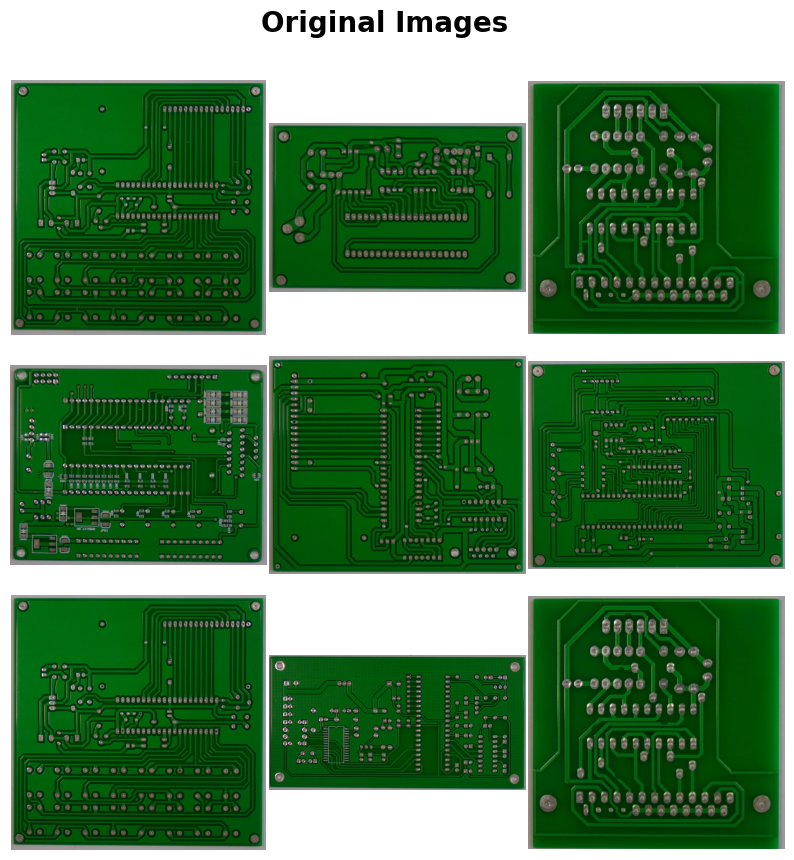

<Figure size 640x480 with 0 Axes>

In [111]:
pcb_visualizer.plot_images(image_dataset, 'Original Images')

## Step 1: Angle Correction

In [112]:
#TODO

## Step 2: Histogram Equalization
### Implementation

In [113]:
def equalize_histogram(tf_image, tf_target):

    cv_img = tf_image.numpy().astype('uint8')
    
    # Apply histogram equalization to each of the RGB channels independently
    channels = cv2.split(cv_img)
    eq_channels = [cv2.equalizeHist(ch) for ch in channels]  
    cv2_eq_image = cv2.merge(eq_channels)
    
    tf_eq_image = tf.convert_to_tensor(cv2_eq_image, dtype=tf.uint8) 
    
    return (tf_eq_image, tf_target)

# Using tf.py_function with the updated function signature
image_dataset_equalized = image_dataset.map(
    lambda img, tgt: tf.py_function(func=equalize_histogram, inp=[img, tgt], Tout=(tf.uint8, tf.int8))
)

### Processed Images

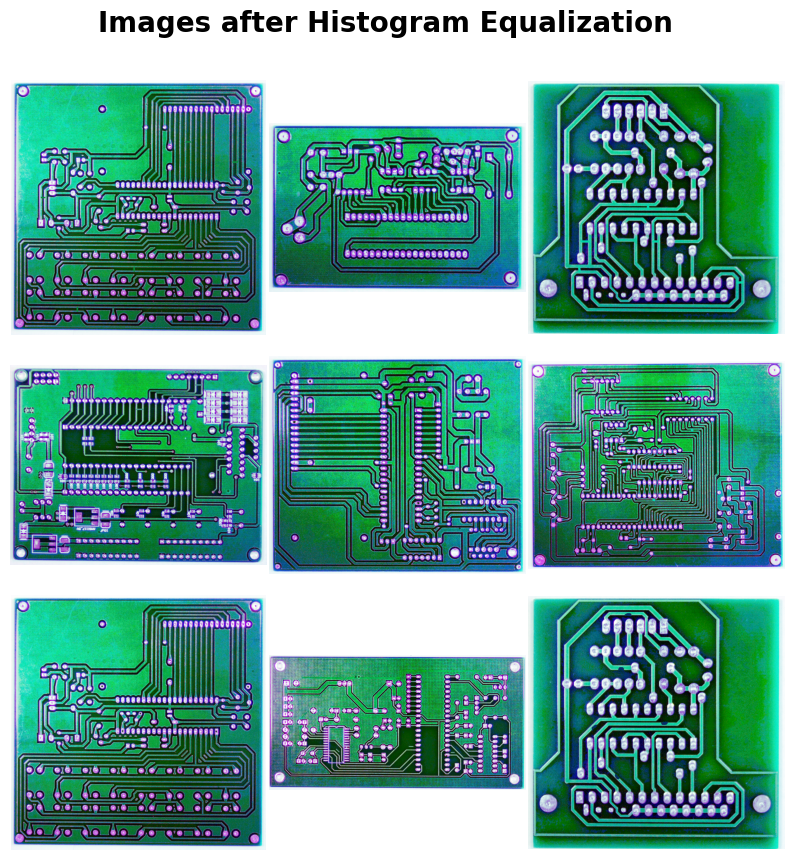

<Figure size 640x480 with 0 Axes>

In [114]:

pcb_visualizer.plot_images(image_dataset_equalized, 'Images after Histogram Equalization')

### Analysis Graphs

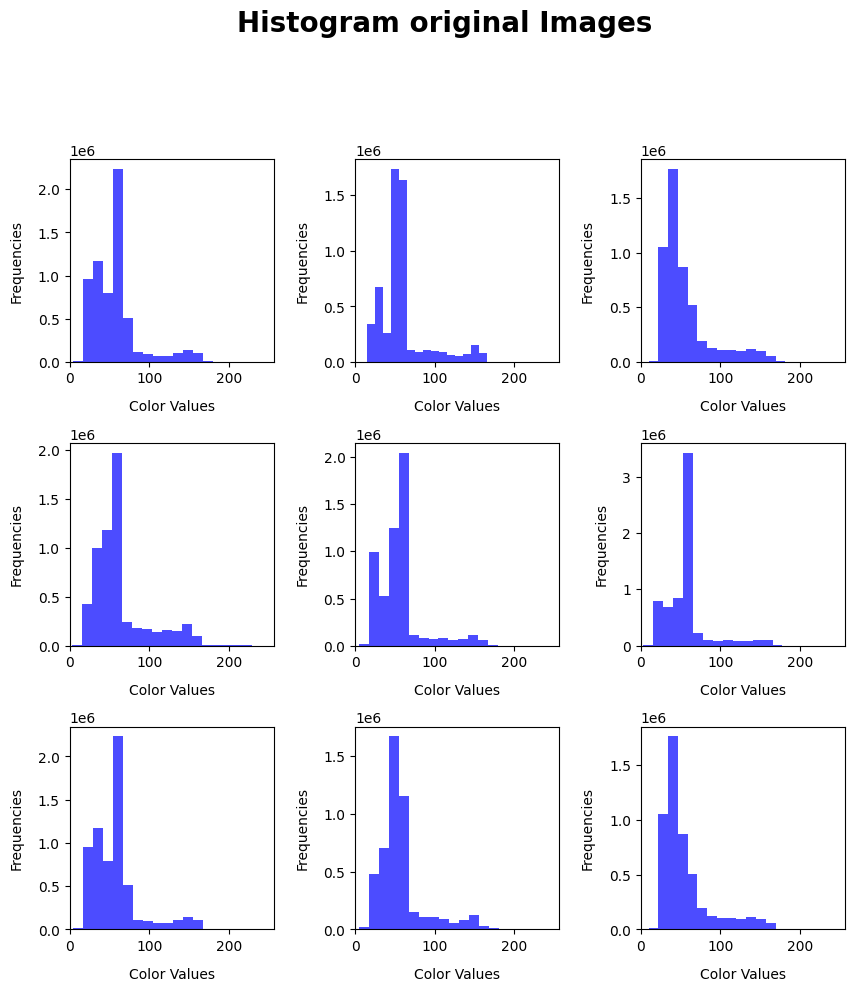

<Figure size 640x480 with 0 Axes>

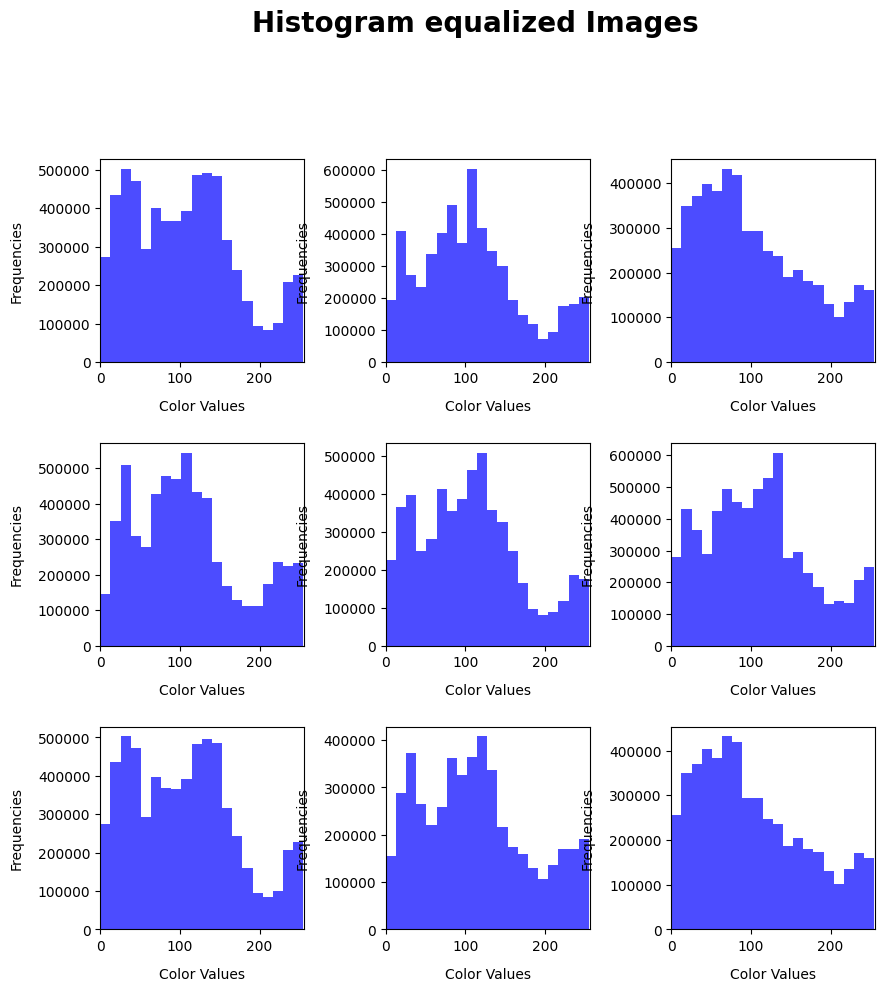

<Figure size 640x480 with 0 Axes>

In [115]:
pcb_visualizer.plot_histograms(image_dataset, 'Histogram original Images')
pcb_visualizer.plot_histograms(image_dataset_equalized, 'Histogram equalized Images')

### Discussion
The images ploted above show a higher contrast comperad to the input images. The improved contrast can help in defect detection, as subtle differences are more visible. This can be also seen in the histogram of the images after histogram equalization: Two peaks are visible representing the solder mask and the copper material. However, it seems also to have introduced or amplified noise. Therefore in the next step the images will be subject to noise reduction. 

## Step 3.a: Gaussian Blurring

### Implementation

In [130]:
def gaussian_blur(tf_img, tf_target, kernel_size=(5, 5)):

    if not kernel_size[0] == kernel_size[1]:
        raise ValueError('Kernel size is not a square kernel.')

    cv_img = (tf_img.numpy()).astype('uint8')
    
    
    k = kernel_size[0] 
    sigma = 0.3*((k-1)*0.5 - 1) + 0.8 # Rule of thumb

    cv_blurred_image = cv2.GaussianBlur(cv_img, kernel_size, sigma)
    
    tf_blurred_image = tf.convert_to_tensor(cv_blurred_image, dtype=tf.uint8)
    
    return (tf_blurred_image, tf_target)

image_dataset_blurred = image_dataset_equalized.map(lambda img, tgt: tf.py_function(func=gaussian_blur, inp=[img, tgt], Tout=(tf.uint8, tf.int8)))

### Processed Images

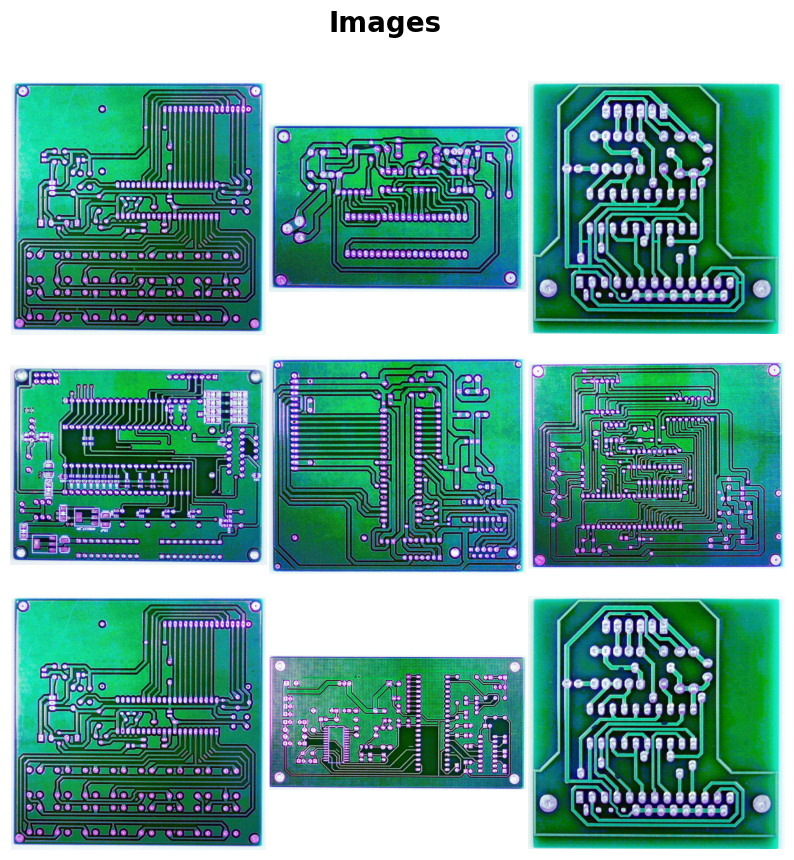

<Figure size 640x480 with 0 Axes>

In [131]:
pcb_visualizer.plot_images(image_dataset_blurred, 'Images Blurred')

### Analysis Graphs

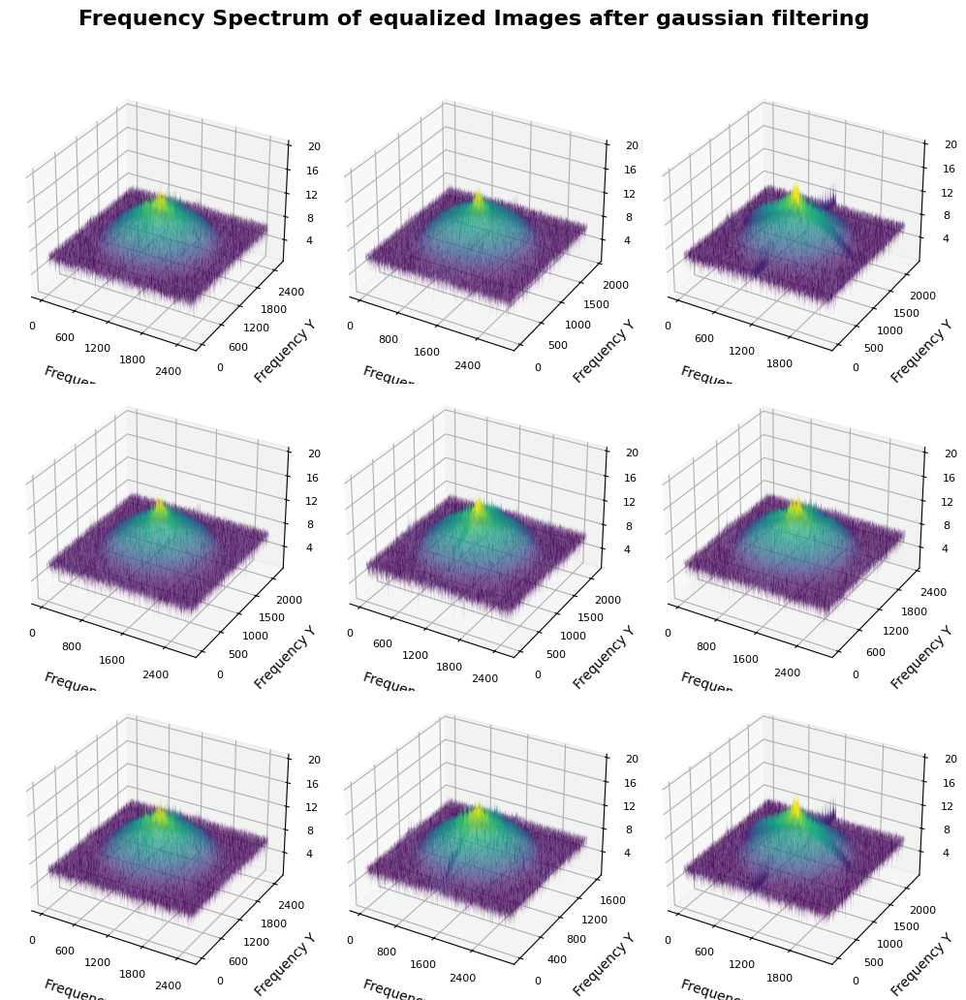

<Figure size 640x480 with 0 Axes>

In [137]:
pcb_visualizer.plot_frequency_spectrum_3D(image_dataset_equalized, 'Frequency Spectrum of Images before noise reduction')
pcb_visualizer.plot_frequency_spectrum_3D(image_dataset_blurred, 'Frequency Spectrum of equalized Images after gaussian filtering')

### Discussion
The processed images to be the same as before the noise reduction. However in the frequency spectrum differences became visible: The noise is reduced and flattened.

## Step 3b: Median Filtering
### Implementation

In [134]:
def median_filter(tf_img, tf_target, kernel_size=5):
    cv_img = (tf_img.numpy()).astype('uint8')
    
    cv_filtered_image = cv2.medianBlur(cv_img, kernel_size)
    
    tf_filtered_image = tf.convert_to_tensor(cv_filtered_image, dtype=tf.uint8)
    
    return (tf_filtered_image, tf_target)

image_dataset_median_filtered = image_dataset_equalized.map(lambda img, tgt: tf.py_function(func=median_filter, inp=[img, tgt], Tout=(tf.uint8, tf.int8)))


### Processed Images

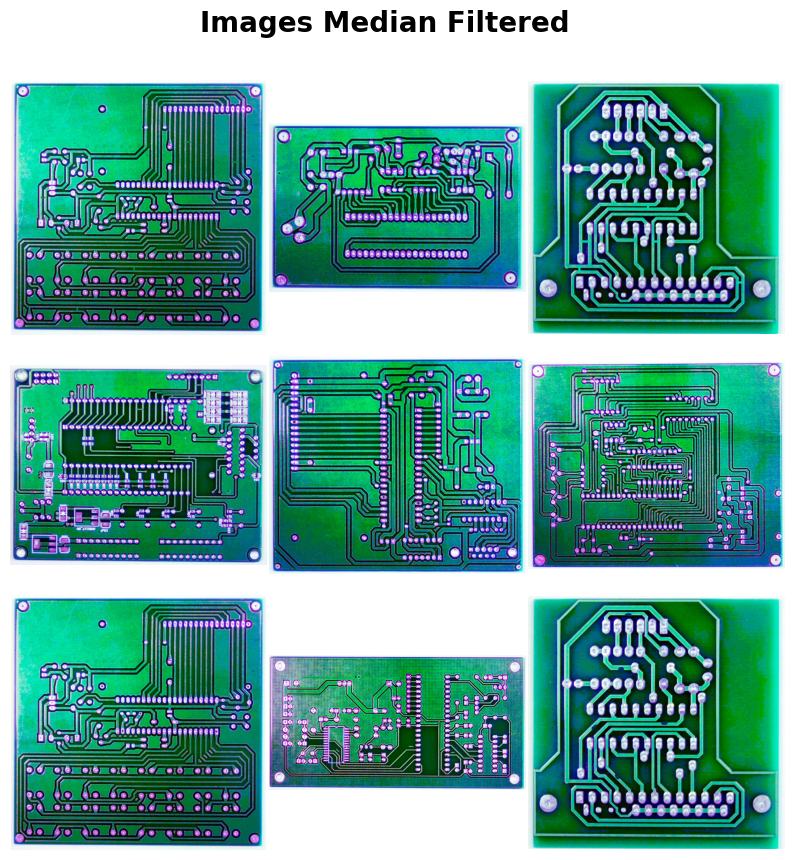

<Figure size 640x480 with 0 Axes>

In [135]:
pcb_visualizer.plot_images(image_dataset_median_filtered, 'Images Median Filtered')

### Analysis Graphs

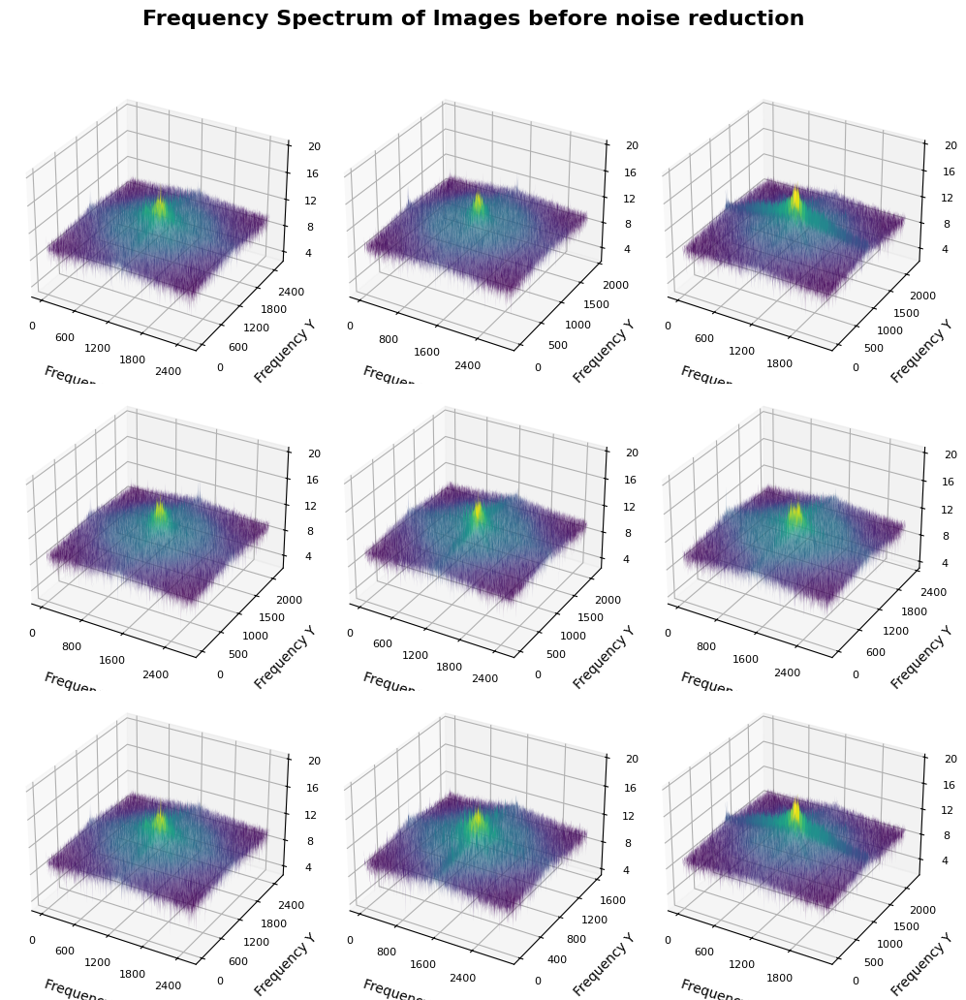

<Figure size 640x480 with 0 Axes>

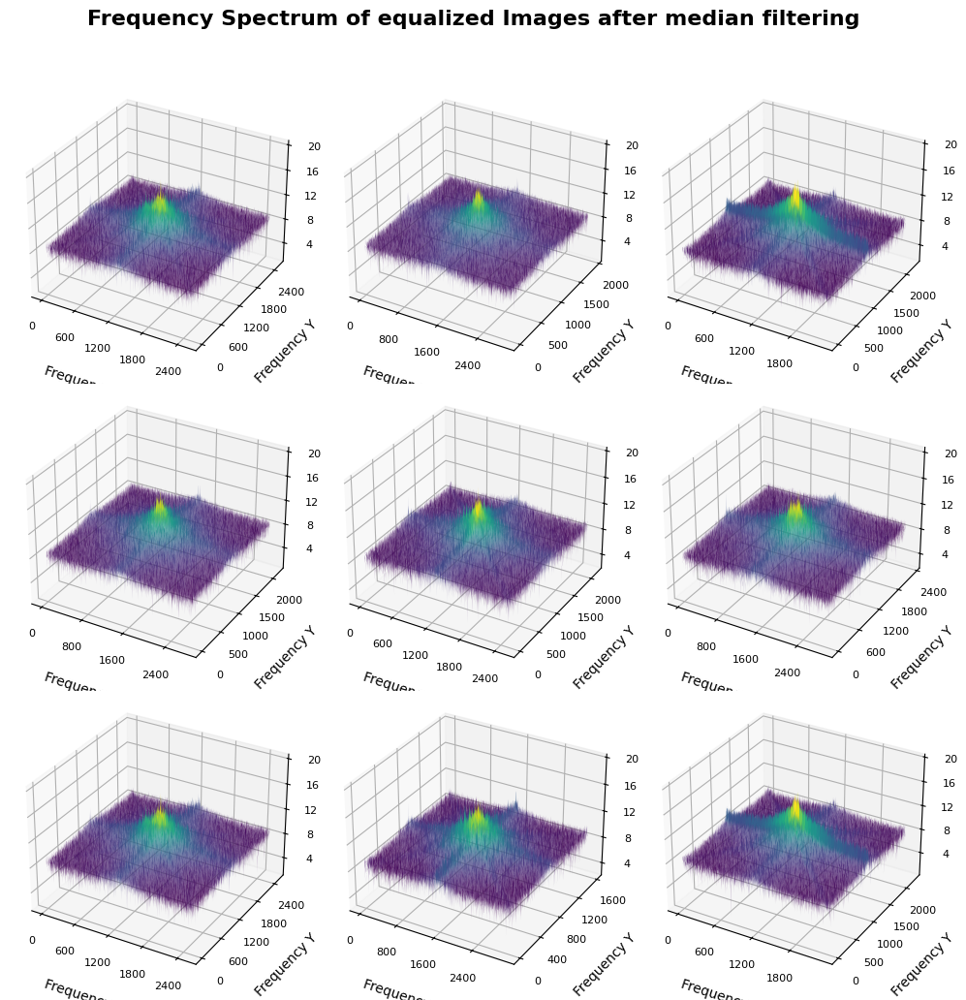

<Figure size 640x480 with 0 Axes>

In [136]:
pcb_visualizer.plot_frequency_spectrum_3D(image_dataset_equalized, 'Frequency Spectrum of Images before noise reduction')
pcb_visualizer.plot_frequency_spectrum_3D(image_dataset_median_filtered, 'Frequency Spectrum of equalized Images after median filtering')

### Discussion
The Performance of filtering noise is slightly reduced compared to the gaussian filter. The median filter is said to preserve better edges as the gaussian filter, this can be recognized through the spikes in the frequency spectrum. The gaussian filter showed more flattened results.

## Step i: Convert to Grayscale

### Implementation

In [119]:
def to_grayscale(*image_data):

    gray_image = tf.image.rgb_to_grayscale(image_data[0])
    
    return (gray_image, image_data[1])

grayscale_dataset = image_dataset.map(to_grayscale)

### Processed Images

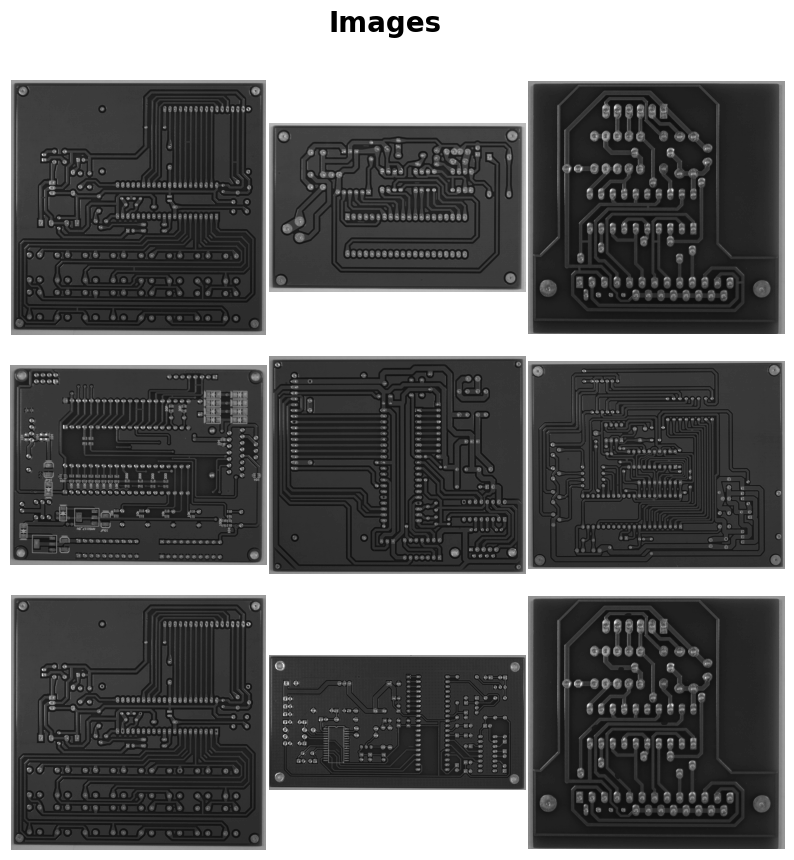

<Figure size 640x480 with 0 Axes>

In [120]:
pcb_visualizer.plot_images(grayscale_dataset)

## Step i+1: Resizing

### Get Shape Statistics

In [121]:
widths = []
heights = []

for image in image_dataset:  
    shape = image[0].shape
    widths.append(shape[0])  
    heights.append(shape[1]) 

widths = np.array(widths)
heights = np.array(heights)

print("Mean Width:", widths.mean())
print("Mean Height:", heights.mean())
print("Std Dev Width:", widths.std())
print("Std Dev Height:", heights.std())
print("Min Width:", widths.min())
print("Min Height:", heights.min())
print("Max Width:", widths.max())
print("Max Height:", heights.max())


Mean Width: 2157.239756180156
Mean Height: 2736.1876058245853
Std Dev Width: 274.6939498536975
Std Dev Height: 265.22556582554705
Min Width: 1586
Min Height: 2240
Max Width: 2530
Max Height: 3056


The statitistics of the image shapes are useful to find the fixed shape to which the images will be resized.
The image will be resized to a square shape. Before resizing the images are brougth to a squared shape with padding.

### Implementation

In [122]:
DESIRED_H_AND_W = 2000

def resize_image(*tf_data):
    image = tf_data[0]
    shape = tf.shape(image)
    height, width = shape[0], shape[1]

    # Get the median pixel value
    flattened_img = tf.reshape(image, [-1])
    sorted_img = tf.sort(flattened_img)
    median_pixel_value = sorted_img[tf.shape(sorted_img)[0] // 2]

    if height > width:
        pad_top = 0
        pad_bottom = 0
        pad_left = (height - width) // 2
        pad_right = height - width - pad_left
    else:
        pad_top = (width - height) // 2
        pad_bottom = width - height - pad_top
        pad_left = 0
        pad_right = 0

    tf_padded_img = tf.pad(image, [[pad_top, pad_bottom], [pad_left, pad_right], [0, 0]], constant_values=median_pixel_value)
    tf_resized_image = tf.image.resize(tf_padded_img, [DESIRED_H_AND_W, DESIRED_H_AND_W], method='nearest')

    return (tf_resized_image, tf_data[1]) 

image_dataset_resized = grayscale_dataset.map(resize_image)


### Processed Images

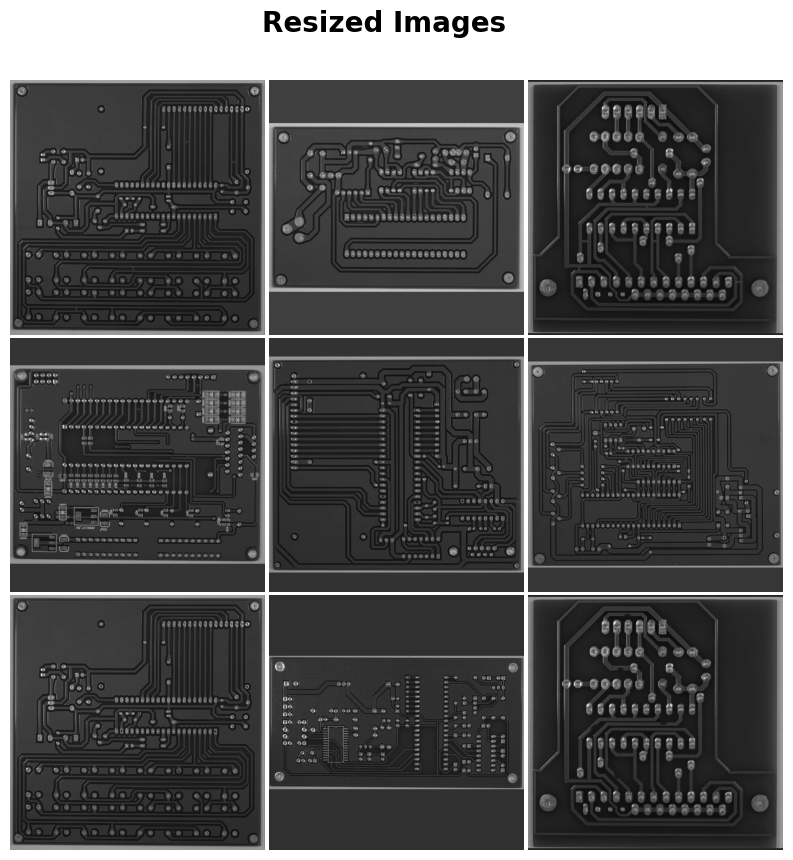

<Figure size 640x480 with 0 Axes>

In [123]:
pcb_visualizer.plot_images(image_dataset_resized, 'Resized Images')

## Step i+2 a: Otsu's Tresholding
### Implementation

In [124]:
def otsu_thresholding(tf_image, tf_target):

    cv_img = tf_image.numpy().astype('uint8')
    
    _, otsu_img = cv2.threshold(cv_img, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)

    tf_otsu_img = tf.convert_to_tensor(otsu_img, dtype=tf.uint8)
    
    tf_otsu_img = tf.reshape(tf_otsu_img, [tf_otsu_img.shape[0], tf_otsu_img.shape[1], 1])
    
    return (tf_otsu_img, tf_target)

otsu_thresholded_dataset = grayscale_dataset.map(
    lambda img, tgt: tf.py_function(func=otsu_thresholding, inp=[img, tgt], Tout=(tf.uint8, tf.int8))
)


### Processed Images

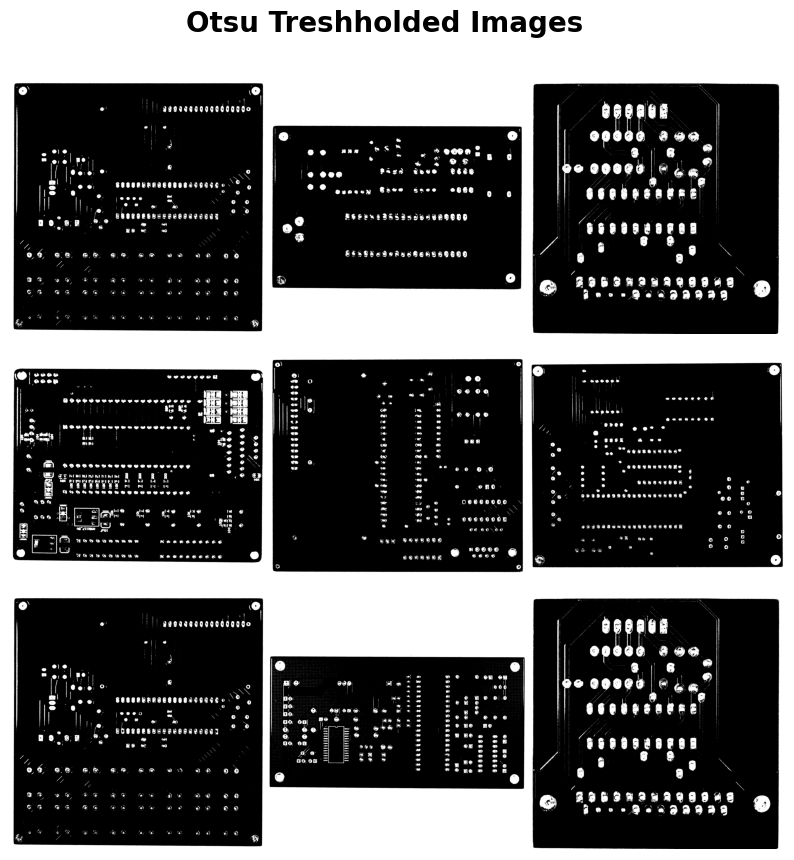

<Figure size 640x480 with 0 Axes>

In [125]:
pcb_visualizer.plot_images(otsu_thresholded_dataset, 'Otsu Treshholded Images')

## Step i+2 b: Adaptive Tresholding
### Implementation 

In [126]:
def adaptive_thresholding(tf_image, tf_target):
    cv_img = tf_image.numpy().astype('uint8')

    adaptive_img = cv2.adaptiveThreshold(cv_img, 
                                         255, 
                                         cv2.ADAPTIVE_THRESH_MEAN_C, 
                                         cv2.THRESH_BINARY,
                                         15, # Block size.
                                         C=-2
                                        ) 
    tf_adaptive_img = tf.convert_to_tensor(adaptive_img, dtype=tf.uint8)
    
    tf_adaptive_img = tf.reshape(tf_adaptive_img, [tf_adaptive_img.shape[0], tf_adaptive_img.shape[1], 1])

    return (tf_adaptive_img, tf_target)

adaptive_thresholded_dataset = grayscale_dataset.map(
    lambda img, tgt: tf.py_function(func=adaptive_thresholding, inp=[img, tgt], Tout=(tf.uint8, tf.int8))
)


### Processed Images

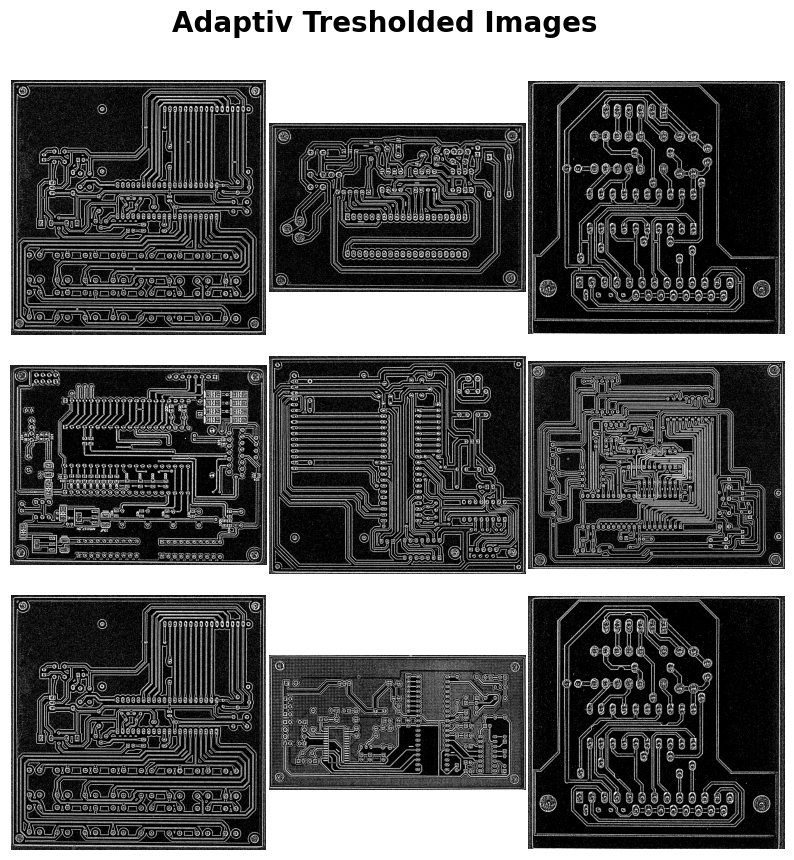

<Figure size 640x480 with 0 Axes>

In [127]:
pcb_visualizer.plot_images(adaptive_thresholded_dataset, 'Adaptiv Tresholded Images')

### Discussion
The Otsu Tresholded Images seem to infer some noise, also detail is lost. The adaptive Tresholded Images seem to be more detailed and to have less noise. The Adaptive Method seems superior, as it also allows to be optimized, changing the parameters: Block Size and Constant Value.

## Step i+3 a: Morphological Opening Operation
### Implementation

In [148]:
import cv2
import tensorflow as tf

def morphological_opening(tf_image, tf_target):

    cv_img = tf_image.numpy().astype('uint8')

    kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (5,5))
    eroded_img = cv2.erode(cv_img, kernel, iterations=1)
    dilated_img = cv2.dilate(eroded_img, kernel, iterations=1)

    tf_dilated_img = tf.convert_to_tensor(dilated_img, dtype=tf.uint8)
    tf_dilated_img = tf.reshape(tf_dilated_img, [tf_dilated_img.shape[0], tf_dilated_img.shape[1], 1])

    return (tf_dilated_img, tf_target)

morphological_opening_dataset = adaptive_thresholded_dataset.map(
    lambda img, tgt: tf.py_function(func=morphological_opening, inp=[img, tgt], Tout=(tf.uint8, tf.int8))
)


### Processed Images

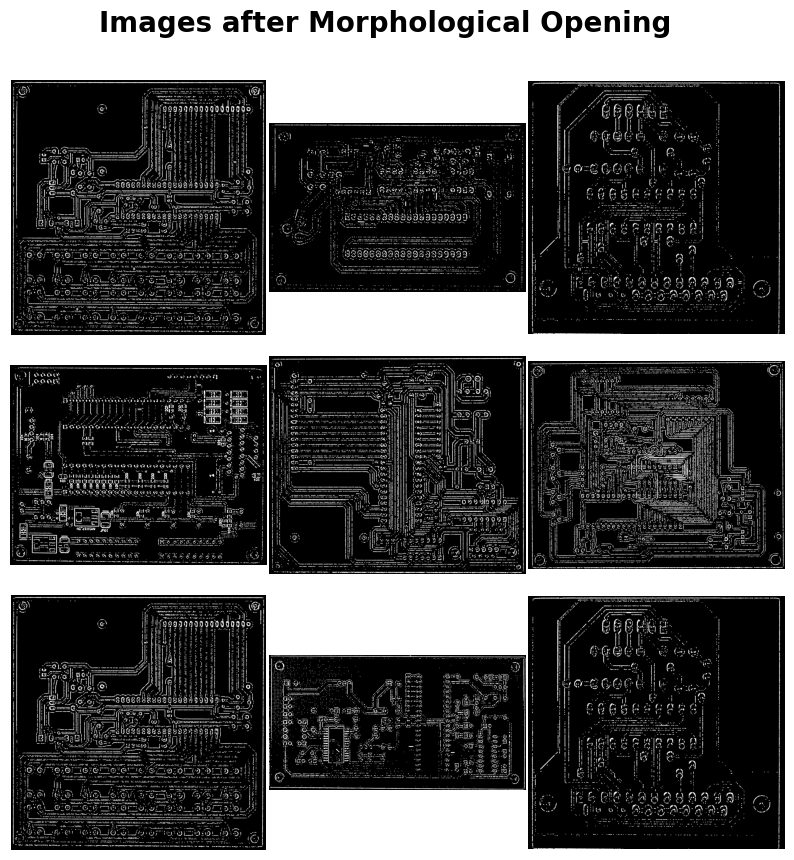

<Figure size 640x480 with 0 Axes>

In [149]:
pcb_visualizer.plot_images(morphological_opening_dataset, 'Images after Morphological Opening')

### Discussion
Applying erosion followed to dilation after tresholding the images seems to cause structural loss, as the operation appears more blurrred and to have induced noise. The operation is not promising for beein a suitable image preprocessing step.

## Step i+3 b: Morphological Closing Operation
### Implementation

In [150]:
import cv2
import tensorflow as tf

def morphological_closing(tf_image, tf_target):

    cv_img = tf_image.numpy().astype('uint8')

    kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (5,5))
    dilated_img = cv2.dilate(cv_img, kernel, iterations=1)
    eroded_img = cv2.erode(dilated_img, kernel, iterations=1)

    tf_dilated_img = tf.convert_to_tensor(dilated_img, dtype=tf.uint8)
    tf_dilated_img = tf.reshape(tf_dilated_img, [tf_dilated_img.shape[0], tf_dilated_img.shape[1], 1])

    return (tf_dilated_img, tf_target)

morphological_closing_dataset = adaptive_thresholded_dataset.map(
    lambda img, tgt: tf.py_function(func=morphological_closing, inp=[img, tgt], Tout=(tf.uint8, tf.int8))
)


### Processed Images

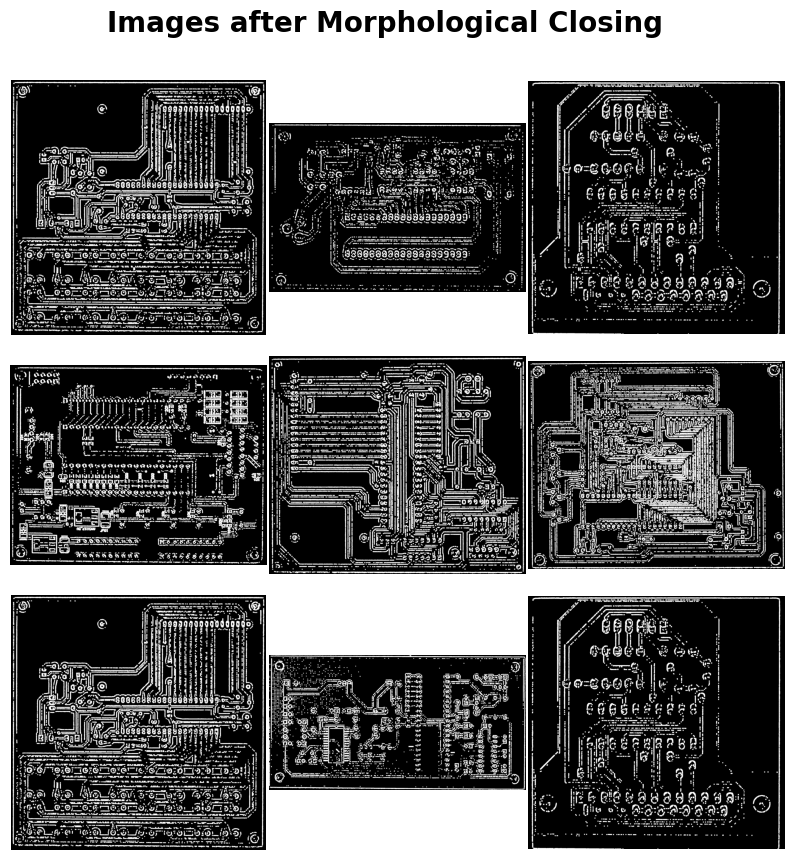

<Figure size 640x480 with 0 Axes>

In [151]:
pcb_visualizer.plot_images(morphological_closing_dataset, 'Images after Morphological Closing')

### Discussion
Applying dilation followed to erosion seems to bring similar results als the opening operation. Both morphological operations are not promising for beein a suitable image preprocessing step.

## Step i+4: Normalization
### Implementation

In [155]:
def normalize_image(*tf_data):

    tf_image = tf_data[0]
    
    tf_normalized_image = tf_image / 255.0

    return (tf_normalized_image, tf_data[1]) 

image_dataset_normalized = thresholded_dataset.map(lambda img, tgt: tf.py_function(func=normalize_image, inp=[img, tgt], Tout=(tf.float32, tf.int8)))

## Step i+5: Standardization
### Implementation

In [156]:
import tensorflow as tf

def standardize_image(*tf_data):
    tf_image = tf_data[0]
    
    # Calculate mean and standard deviation
    image_mean = tf.math.reduce_mean(tf_image)
    image_stddev = tf.math.reduce_std(tf_image)
    
    # Standardize the image
    tf_standardized_image = (tf_image - image_mean) / image_stddev
    
    return (tf_standardized_image, tf_data[1])

image_dataset_standardized = image_dataset_normalized.map(lambda img, tgt: tf.py_function(func=standardize_image, inp=[img, tgt], Tout=(tf.float32, tf.int8)))
